# Aim of Analysis

Pick your favourite  forest and analyse and share your findings

Following the analysis guidelines from the data analysis repo,

I will make global anlysis first then narrow my analysis to regional analysis

In the global analysis I did the following:

* [Visualised to see all the types of forests in the world and their locations from the data](#Forests-in-the-world)
* I picked interest in the tropical dry forests and analysed the data to see the following properties of tropical dry forests in the world:
    * [Agroecological zones](#AgroEcological-zones-of-forest)
    * [Biomes](#Terrestial-Ecoregions)
    * [Climate](#Climate)
    * [Soil resources](#Soil)
    * [Water scarcity](#-scarcity)
    * [Land resource dominance](#Land-resource-dominant-cover)
    * [Soil Resource Nutrient Avilability](#Soil-Resource-Nutrient-Avilability)
    * [Terrain sustainability](#Terrain-sustainability)
    * [Rooting conditions](#Rooting-conditions)

In [1]:
#import necessary libraries

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
import folium
import rasterio as rst
import earthpy as ep
import warnings
warnings.filterwarnings('ignore')
import rasterio.plot
import earthpy.plot

In [2]:
class Read():
    ''' Read and wrangle data
    str link,
    list columns
    '''
    def __init__(self, url, columns = None):
        self.url = url
        self.columns = columns
        
    def retrieve_data(self, json):
        '''retrieve data from url'''
        self.req = requests.get(self.url)
        if json:
            self.req = str(self.req.text)
        else:
            self.req = self.req.content
        return self.req

    def wrangle(self,online = False, replace_values = False, column_to_change = None,
               old_values = None, new_values = None, filter_columns = False):
        '''read in and wrangle data '''
        if online:
            self.url = self.req
        self.df = gpd.read_file(self.url)
        self.df = self.df.replace(['n/a', 'Unknown', ' '], np.nan)
        self.df.columns = self.df.columns.str.lower()
        if replace_values:
            self.df[column_to_change] = self.df[column_to_change].replace(old_values, new_values)
        if filter_columns:
            self.df = self.df[self.columns]
        self.df = self.df.dropna()
        self.df.geometry = self.df.geometry.to_crs(4326)
        self.df['centroid'] = self.df.geometry.centroid
        return self.df

In [3]:
def folium_plot(title, data, column_name):
    loc = title
    title_html = '''
                     <h3 align="center" style="font-size:16px"><b>{}</b></h3>
                 '''.format(loc)   

    m = folium.Map(location=[-8.7832, 34.5085], zoom_start=1.5, tiles='CartoDB positron',
                   min_zoom = 1.5, max_zoom = 2)

    for _, r in data.iterrows():
        # Without simplifying the representation of each area,
        # the map might not be displayed
        sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
        geo_j = sim_geo.to_json()
        geo_j = folium.GeoJson(data=geo_j,
                               style_function=lambda x: {'fillColor': 'orange'})
        folium.Popup(r[column_name]).add_to(geo_j)
        geo_j.add_to(m)

    m.get_root().html.add_child(folium.Element(title_html))
    return m

In [4]:
def plot_within(data, column, title, ncol):
    ax = data.plot(column = column,  figsize= (20, 8), legend = True, cmap = 'YlOrRd',
                        legend_kwds = {'ncol': ncol, 'loc' : 'center', 'bbox_to_anchor': (1.2, 0.5)})
    tropical_dry_forest.plot(ax = ax, color = 'black')
    plt.title(title);

In [5]:
def plot_number(data, column, title):
    gdf = gpd.clip(data, tropical_dry_forest)
    values = gdf[column].value_counts().to_list()
    zones = gdf[column].value_counts().index.to_list()
    sns.barplot(y = zones, x = values, color = 'brown')
    plt.title(title,
             fontsize = 19, pad = 2);

# **Global Analysis**

### Administration

<b> View location and boundaries of different forests in the world </b>

In [6]:
url = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/HoldridgeLifeZones.json'
bio = Read(url)
bio.retrieve_data(json = True)
bio = bio.wrangle(online = True)

#filter forests
a = bio['desc'].str.contains('forest')
bio = bio[a].reset_index()

bio.head(2)

,index,fid,area,perimeter,holdrig_,holdrig_id,zone,case_,frequency,desc,symbol,geometry,centroid
0,110,110,0.75,4,112,197,10,11,254,Boreal wet forest,20,"POLYGON ((24.50000 71.00000, 24.00000 71.00000...",POINT (23.75000 70.75000)
1,121,121,0.25,2,123,196,10,11,254,Boreal wet forest,20,"POLYGON ((21.00000 70.50000, 21.00000 70.00000...",POINT (21.25000 70.25000)


##### Forests in the world

In [7]:
folium_plot('Location of forests in the world', bio, 'desc')

### I am interested in the Tropical dry forests

<b> I want to view locations and boundaries of tropical dry forests in the world</b>

In [8]:
# subset tropical dry forest
tropical_dry_forest = bio[bio['desc'] == 'Tropical dry forest']

tropical_dry_forest.head(2)

,index,fid,area,perimeter,holdrig_,holdrig_id,zone,case_,frequency,desc,symbol,geometry,centroid
971,2365,2365,0.25,2,2367,1552,36,37,201,Tropical dry forest,214,"POLYGON ((73.00000 34.00000, 72.50000 34.00000...",POINT (72.75000 33.75000)
992,2444,2444,1.25,6,2446,1563,36,37,201,Tropical dry forest,214,"POLYGON ((74.50000 33.00000, 74.50000 32.50000...",POINT (75.25000 32.25000)


In [9]:
#save file

# forest = tropical_dry_forest.drop(['centroid'], axis = 1)
# forest.to_file('data/ favourite_forest.geojson')

In [10]:
folium_plot('Location of Tropical forests in the world', tropical_dry_forest, 'desc')

###### AgroEcological zones of forest

In [11]:
file_path = 'data/Bioclimatic and ecological zones/GlobalAgroEcologicalZones_GAEZ.geojson'


agros = ['Steep terrain', 'Artic/Cold', 'Desert/Arid', 'Irrigated Soils', 'Hydromorphic soils', 
 'Dry, good soils', 'Dry, moderate soils', 'Dry, poor soils', 'Moist, good soils', 
 'Moist, moderate soils', 'Moist, poor soils', 'Sub-humid, good soils', 'Sub-humid, moderate soils', 
 'Sub-humid, poor soils', 'Humid, good soils', 'Humid, moderate soils', 'Humid, poor soils', 'Water']

numb = [i for i in range(1, 19)]

agroeco_df = Read(file_path)
agroeco_df = agroeco_df.wrangle(replace_values = True, column_to_change = 'value',
               old_values = numb, new_values = agros)
agroeco_df.head(2)

,value,geometry,centroid
0,Steep terrain,"POLYGON ((-33.50000 83.65000, -33.50000 83.500...",POINT (-33.19122 83.57635)
1,Steep terrain,"POLYGON ((-37.85000 83.60000, -37.85000 83.500...",POINT (-37.75000 83.55000)


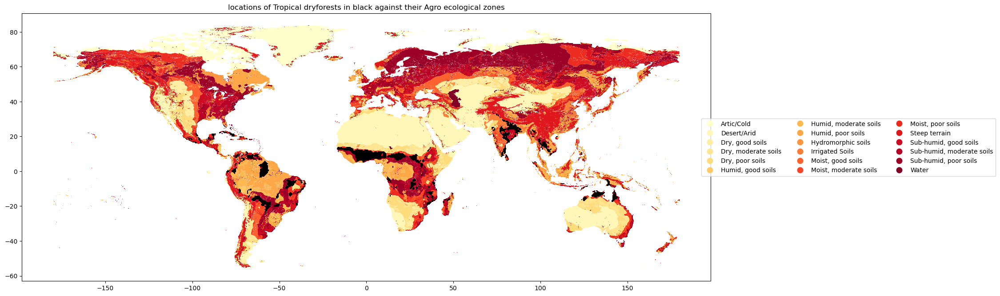

In [12]:
plot_within(agroeco_df, 'value', 
            'locations of Tropical dryforests in black against their Agro ecological zones', 3)

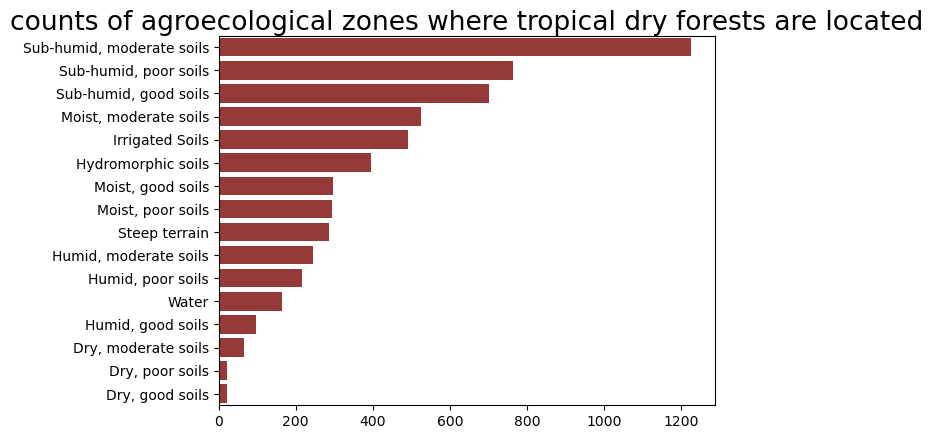

In [13]:
# filter the agroecological zones of tropical dry forests
plot_number(agroeco_df, 'value', 
            'counts of agroecological zones where tropical dry forests are located')

<b>from the visualisations above, the agroecological zones of the tropical forests are mostly subhumid soils</b>

###### Terrestial Ecoregions

In [14]:
biomes = ['Tropical and subtropical moist broadleaf forests', 'Tropical and subtropical dry broadleaf forests',
'Tropical and subtropical coniferous forests', 'Temperate broadleaf and mixed forests'
'Temperate coniferous forests', 'Boreal forests/taiga', 'Tropical and subtropical grasslands', 
'savannas, and shrublands', 'Temperate grasslands, savannas, and shrublands',
'Flooded grasslands and savannas', 'Montane grasslands and shrublands', 'Tundra (Arctic)',
'Mediterranean forests, woodlands, and scrub or sclerophyll forests',
'Deserts and xeric shrublands','Mangrove']
initial = [i for i in range(1, 15)]

In [15]:
# It has null values so using the read class will drop all rows

columns = ['eco_name', 'biome', 'geometry']
file_path = 'data/Bioclimatic and ecological zones/TerrestrialEcoregionsoftheWorld_WWF.geojson'
terreco_df = Read(file_path, columns)
terreco_df = terreco_df.wrangle(replace_values = True, column_to_change = 'biome',
               old_values = initial, new_values = biomes, filter_columns = True)
terreco_df.head(2)

,eco_name,biome,geometry,centroid
0,Northern Mesoamerican Pacific mangroves,Mangrove,"POLYGON ((-112.30433 29.33480, -112.29035 29.3...",POINT (-112.31337 29.35268)
1,Northern Mesoamerican Pacific mangroves,Mangrove,"POLYGON ((-112.19639 29.20719, -112.19669 29.2...",POINT (-112.20791 29.21550)


In [16]:
#save file

# fav_forest = terreco[terreco['eco_name'] == 'Southern New Guinea freshwater swamp forests']
# fav_forest = fav_forest.drop(['centroid'], axis = 1)
# fav_forest.to_file('data/Southern New Guinea freshwater swamp forest.geojson')

In [17]:
terreco = gpd.clip(terreco_df, tropical_dry_forest)
folium_plot('Name of tropical dry forests in the world', terreco, 'eco_name')

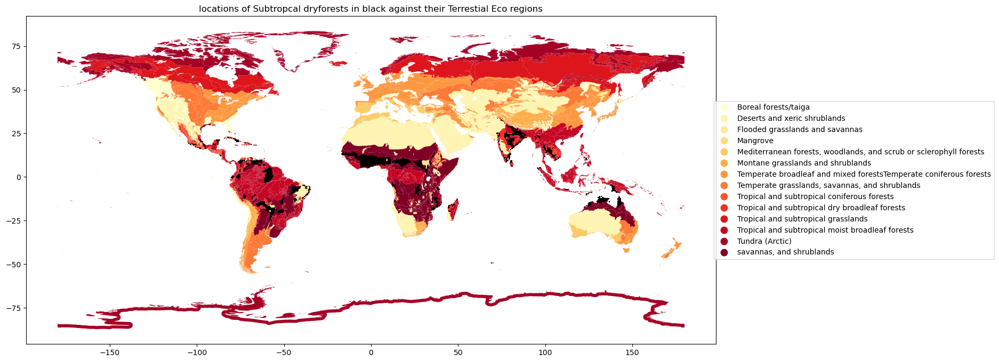

In [18]:
plot_within(terreco_df, 'biome', 
            'locations of Subtropcal dryforests in black against their Terrestial Eco regions', 1)

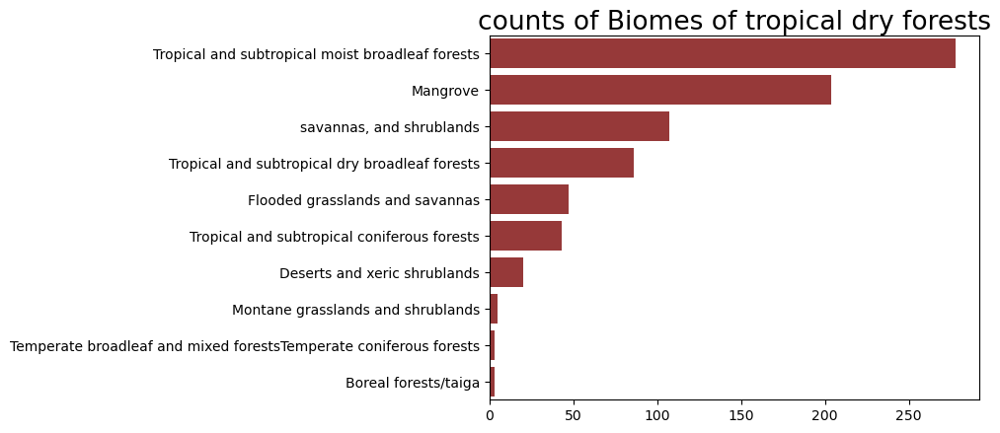

In [19]:
plot_number(terreco_df, 'biome', 'counts of Biomes of tropical dry forests')

<b> From the visualisations, most of the tropical dry forests are Tropical and subtropical moist broadleaf forests, Mangrove, Savannas and shrublands

###### Climate

In [20]:
climates = ['Warm Temperate Moist', 'Warm Temperate Dry', 'Cool Temperate Moist', 'Cool Temperate Dry', 
'Polar Moist', 'Polar Dry', 'Boreal Moist', 'Boreal Dry', 'Tropical Montane', 'Tropical wet',
 'Tropical Moist', 'Tropical Dry']

numbers = [i for i in range(1, 13)]

In [23]:
url = 'data/climate/IPCC_ClimateZoneMap_Vector.geojson'

climate = Read(url)
climate = climate.wrangle(replace_values = True, column_to_change = 'class_name',
               old_values = numbers, new_values = climates)
climate.head(2)


,class_name,geometry,centroid
0,0,"MULTIPOLYGON (((-37.65000 83.50000, -37.65000 ...",POINT (-37.57500 83.45000)
1,0,"MULTIPOLYGON (((-38.75000 83.40000, -38.75000 ...",POINT (-38.70000 83.37500)


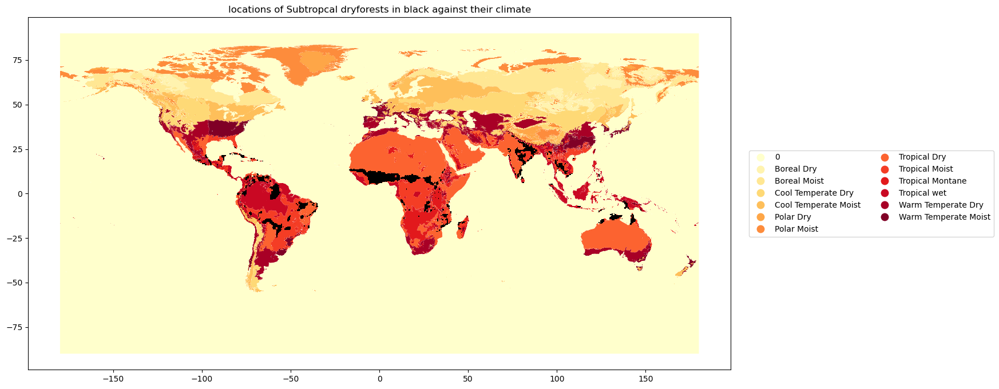

In [24]:
plot_within(climate, 'class_name', 
            'locations of Subtropcal dryforests in black against their climate', 2)

<b>As expected the forests fall within the tropical climate zones

###### Soil

In [27]:
url = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/World_Soil_Resources_wgs84.geojson'

soil_resource = Read(url)
soil_resource.retrieve_data(json = True)
soil_resource = soil_resource.wrangle(online = True)# to read area_geo


soil_resource.head(2)

,sname,ipcc,geometry,centroid
0,AB,Albeluvisol,"MULTIPOLYGON (((31.77594 49.15567, 31.98717 49...",POINT (22.57850 57.24980)
1,AC,Acrisol,"MULTIPOLYGON (((116.05041 -2.90441, 116.04652 ...",POINT (19.45196 8.64741)


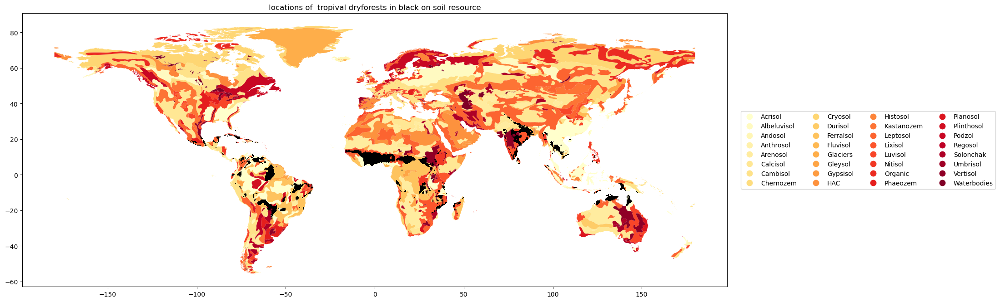

In [28]:
plot_within(soil_resource, 'ipcc', 
            'locations of  tropival dryforests in black on soil resource', 4)

<b> The forests are of different soil types in different locations</b>

###### Water scarcity

In [43]:
def plot_tiffs(path, cmap, title):
    img = rst.open(path)
    img_ = img.read()
    plot_ext = rst.plot.plotting_extent(img)
    fig, ax = plt.subplots()
    ep.plot.plot_bands(img_,
                  title= title,
                  cmap= cmap, ax = ax, extent = plot_ext)
    tropical_dry_forest.plot(ax = ax, color = 'red')

    plt.show()

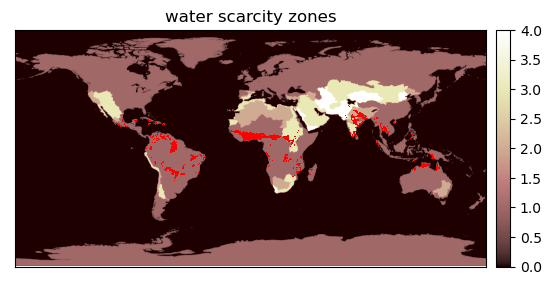

In [45]:
rst_water = r'data/Bioclimatic and ecological zones/WaterScarcity_GAEZ.tif'
plot_tiffs(rst_water, 'pink', 'water scarcity zones')

<b>Land resource dominant cover

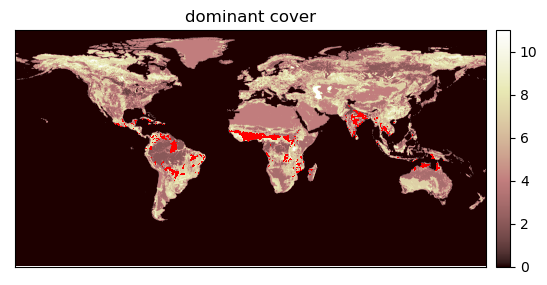

In [46]:
rst_dom = r'data/Bioclimatic and ecological zones/LandResource_DomLandCover_GAEZ.tif'
plot_tiffs(rst_dom, 'pink', 'dominant cover')

<b> Soil Resource Nutrient Avilability </b>

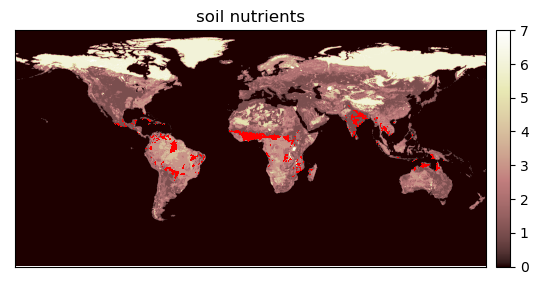

In [50]:
rst_prot = r'data/Bioclimatic and ecological zones/SoilResources_NutrientAvailability_GAEZ.tif'
plot_tiffs(rst_prot, 'pink', 'soil nutrients')

<b> Terrain sustainability</b>

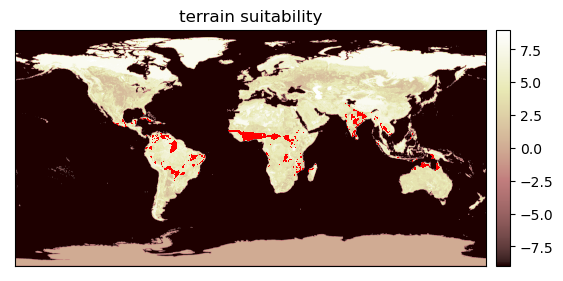

In [51]:
path = r'data/Bioclimatic and ecological zones/SoilResources_RainfedSoilTerrainSuitability_GAEZ.tif'
plot_tiffs(path, 'pink', 'terrain suitability')

<b> Rooting conditions </b>

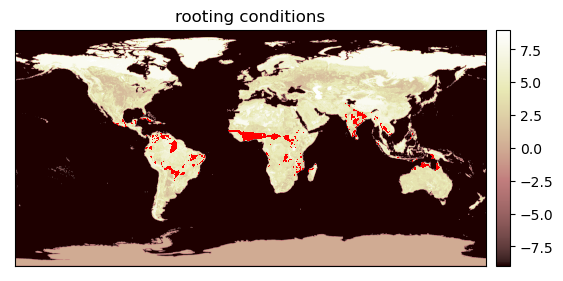

In [52]:
rst_prot = r'data/Bioclimatic and ecological zones/SoilResources_RootingConditions_GAEZ.tif'
plot_tiffs(path, 'pink', 'rooting conditions')

## Global analysis of forests 

The task is to pick a favourite forest.  

### Administrative boundaries

To see the avilable forests I plotted all forests from the data I got [here](https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/HoldridgeLifeZones.json) and I have this
![forests in the world](images/forests_in_the_world.JPG)

Then I picked interest in `tropical dry forests` and focused analysis on this type of forest
The locaton and boundaries of tropical dry forests is shown here:
![Tropical forests in the world](images/tropical_forests_location.JPG)

### Bioclimatic zones

###### Agro-ecological zones

I plotted the forest aginst tyheir agroecological zones here:
![Agro ecological zones](images/agro_eco_zones.png)

The forests are mostly found in the subhumid soils and moist soils agro-ecological zones


###### Water scarcity zones

I plotted the forest aginst tyheir agroecological zones here:
![Water scarcity zones](images/water_scarcity.png)

The forests are located mostly in the economic water scarcity zones and alos in the physical water scarcity zones


###### Soil nutrients

I plotted the forest aginst tyheir agroecological zones here:
![Water scarcity zones](images/soil_nutrients.png)

The forests are located ????


###### Dominant soil cover

I plotted the forest aginst tyheir agroecological zones here:
![Water scarcity zones](images/dominant_cover.png)

The forests are located ???

### Soil resources

I plotted to see the kind of soils in tropical dry forsts
![Soil resources](images/soil.png)